# Outer approximation of Julia set

**Adapted from**: Section 7.1.3 of [KHJ14]

[KHJ14] Milan Korda, Didier Henrion, and Colin N. Jones.
*Convex computation of the maximum controlled invariant set for polynomial control systems*.
SIAM Journal on Control and Optimization 52.5 (2014): 2944-2969.

The Julia map is defined as follows:

In [1]:
function julia_map(point, c)
    a, b = point
    return [a^2 - b^2 + real(c), 2a * b + imag(c)]
end

julia_map (generic function with 1 method)

The *escape radius" is the radius `r` such that `r^2 ≥ r + abs(c)`.
Ouside of the circle of that radius, all points diverge so we know the Julia set belongs to that circle.

In [2]:
escape_radius(c) = (1 + √(1 + 4 * abs(c))) / 2

escape_radius (generic function with 1 method)

To check whether a point is in the Julia set, we can iterate and once the point leaves the circle of escape radius,
we consider that it is not in the Julia set, if it stays in the set, we consider that it is in the Julia set.
This gives an outer approximation that converges to the Julia set when `m` increases.

In [3]:
using LinearAlgebra
function in_set(x, c, m=2000)
    r = escape_radius(c)
    for i in 1:m
        if norm(x) > r
            return false
        end
        x = julia_map(x, c)
    end
    return true
end

in_set (generic function with 2 methods)

To sort of minimize a level set of a polynomial we minimize integral of that polynomial.
We borrow the following from https://doi.org/10.1080/00029890.2001.11919774

In [4]:
using SpecialFunctions
using DynamicPolynomials
β(α) = (α + 1) / 2
function circle_integral(mono::AbstractMonomial)
    if any(isodd, exponents(mono))
        return 0.0
    else
        return 2 * prod(gamma ∘ β, exponents(mono)) / gamma(sum(β, exponents(mono)))
    end
end
function disk_integral(mono::AbstractMonomial, r)
    d = degree(mono) + nvariables(mono)
    return circle_integral(mono) * r^d / d
end
function disk_integral(p::AbstractPolynomialLike, r)
    return sum(MultivariatePolynomials.coefficient(t) * disk_integral(monomial(t), r) for t in terms(p))
end

disk_integral (generic function with 2 methods)

The following function implements [KHJ14, (8)].

In [5]:
using SumOfSquares
function outer_approximation(solver, d::Int, c; α = 1/2)
    @polyvar x[1:2]
    model = SOSModel(solver)
    r = escape_radius(c)
    S = @set sum(x.^2) <= r^2
    @variable(model, v, Poly(monomials(x, 0:2d)))
    @variable(model, w0, SOSPoly(monomials(x, 0:d)))
    @variable(model, w1, SOSPoly(monomials(x, 0:(d - 1))))
    @constraint(model, α * v(x => julia_map(x, c)) <= v, domain = S)
    w = w0 + w1 * (r^2 - sum(x.^2))
    @constraint(model, w >= v + 1, domain = S)
    @objective(model, Min, disk_integral(w, r))
    optimize!(model)
    println(solution_summary(model))
    if primal_status(model) == MOI.NO_SOLUTION
        return
    end
    return value(v), value(w)
end

outer_approximation (generic function with 1 method)

The following function plots the Julia set with the outer approximation.

In [6]:
using ImplicitPlots
using Plots
function julia_plot(poly, c, n=200, m=1000; tol=1e-6, res = 1000)
    r = escape_radius(c)
    p = implicit_plot(poly; xlims=(-r, r) .* 1.1, ylims=(-r, r), resolution = res, label="")
    θ = range(0, stop=2π, length=100)
    points = Vector{Float64}[]
    as = range(-r, r, length=n)
    bs = range(-r, r, length=n)
    for a in as, b in bs
        point = [a, b]
        if in_set(point, c, m)
            push!(points, point)
        end
    end
    xs = [point[1] for point in points]
    ys = [point[2] for point in points]
    scatter!(p, xs, ys, label="", markerstrokewidth=0, markersize=1, m=:pixel)
    return p
end

julia_plot (generic function with 3 methods)

We need to pick an SDP solver, see [here](https://jump.dev/JuMP.jl/v1.8/installation/#Supported-solvers) for a list of the available choices.

In [7]:
import CSDP
solver = optimizer_with_attributes(CSDP.Optimizer, MOI.Silent() => true)

MathOptInterface.OptimizerWithAttributes(CSDP.Optimizer, Pair{MathOptInterface.AbstractOptimizerAttribute, Any}[MathOptInterface.Silent() => true])

Let's start with the value of `c` corresponding to the left image of [KHJ14, Figure 3] and with degree 2.

In [8]:
c = -0.7 + 0.2im
v, w = outer_approximation(solver, 2, c)

* Solver : CSDP

* Status
  Result count       : 1
  Termination status : OPTIMAL
  Message from the solver:
  "Problem solved to optimality."

* Candidate solution (result #1)
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Objective value    : 6.02400e+00
  Dual objective value : 6.02400e+00

* Work counters
  Solve time (sec)   : 4.46189e-01



(-0.0686556367721611x₁⁴ - 0.05458391605772464x₁³x₂ - 0.6489606845511555x₁²x₂² + 0.06780560319970436x₁x₂³ - 0.2665720190173939x₂⁴ + 3.984336471862804e-10x₁³ + 3.658798264360996e-10x₁²x₂ + 5.878539044434916e-10x₁x₂² - 1.6908696665041134e-11x₂³ + 0.12317126100285988x₁² - 0.09236780112188545x₁x₂ + 0.14890885831788928x₂² - 7.450902672623272e-10x₁ - 2.0702273229034063e-11x₂ + 0.05297614750980312, -0.06865563669234884x₁⁴ - 0.0545839158567642x₁³x₂ - 0.6489606839119391x₁²x₂² + 0.06780560366919947x₁x₂³ - 0.26657201859267043x₂⁴ + 3.6998621538149123e-10x₁³ + 2.671660977799953e-10x₁²x₂ + 3.894442957978054e-10x₁x₂² - 1.0450282563351268e-10x₂³ + 0.12317126090106878x₁² - 0.09236780134703515x₁x₂ + 0.14890885799205167x₂² - 7.056717349755482e-10x₁ + 2.576565065944851e-11x₂ + 1.0529761477600965)

We visualize below:

┌ Warning: Skipped marker arg pixel.
└ @ Plots ~/.julia/packages/Plots/io9zQ/src/args.jl:1147


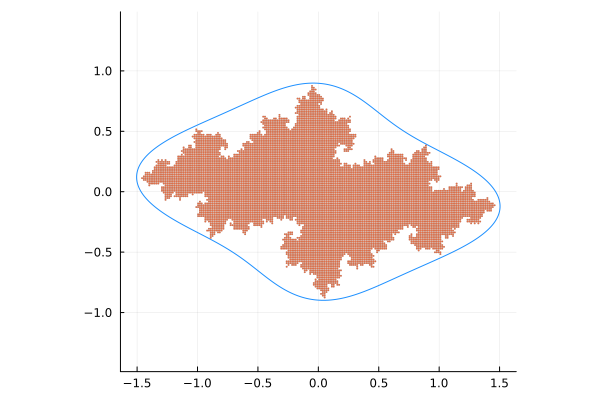

In [9]:
julia_plot(v, c)

Let's now look at degree 4.

In [10]:
v, w = outer_approximation(solver, 4, c)

* Solver : CSDP

* Status
  Result count       : 1
  Termination status : ALMOST_OPTIMAL
  Message from the solver:
  "Problem solved to near optimality."

* Candidate solution (result #1)
  Primal status      : NEARLY_FEASIBLE_POINT
  Dual status        : NEARLY_FEASIBLE_POINT
  Objective value    : 5.03026e+00
  Dual objective value : 5.03038e+00

* Work counters
  Solve time (sec)   : 7.46916e+00



(0.0009658124700010484x₁⁸ - 0.15854290028337714x₁⁷x₂ - 3.984260036392021x₁⁶x₂² - 2.901783891552969x₁⁵x₂³ - 6.346647857919451x₁⁴x₂⁴ - 4.900975094877761x₁³x₂⁵ - 8.007827113052276x₁²x₂⁶ - 4.922072642697206x₁x₂⁷ - 0.9218386650349407x₂⁸ + 0.016119414809658672x₁⁷ - 0.0032309206796630185x₁⁶x₂ + 0.11640109691091993x₁⁵x₂² - 0.3499775274993223x₁⁴x₂³ - 0.7601415103946186x₁³x₂⁴ - 0.5307653144042552x₁²x₂⁵ - 0.1736913190850527x₁x₂⁶ - 0.2565733102119976x₂⁷ - 0.12821445562880984x₁⁶ - 0.23786374054311543x₁⁵x₂ + 7.420510903520389x₁⁴x₂² + 3.522337052542815x₁³x₂³ + 3.973312533618274x₁²x₂⁴ + 6.8082895121339355x₁x₂⁵ + 1.9017535837394406x₂⁶ - 0.040751110613671315x₁⁵ + 0.09479475093310985x₁⁴x₂ + 0.12415336446343717x₁³x₂² + 0.5817878768771538x₁²x₂³ + 0.4044140042025176x₁x₂⁴ + 0.4787294757915837x₂⁵ + 0.26439387534045866x₁⁴ + 0.2710854718213961x₁³x₂ - 4.381535899443785x₁²x₂² - 3.778979103440881x₁x₂³ - 2.462025035032229x₂⁴ + 0.014292088142497439x₁³ - 0.11785754330655113x₁²x₂ - 0.1124974045707895x₁x₂² - 0.26138676

We visualize below:

┌ Warning: Skipped marker arg pixel.
└ @ Plots ~/.julia/packages/Plots/io9zQ/src/args.jl:1147


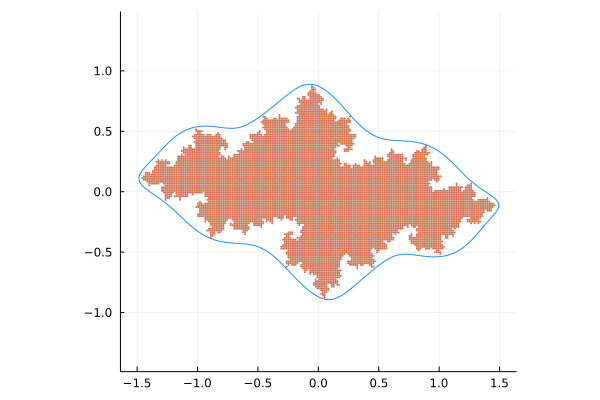

In [11]:
julia_plot(v, c)

Let's now use the value of `c` corresponding to the right image of [KHJ14, Figure 3] and with degree 2.

In [12]:
c = -0.9 + 0.2im
v, w = outer_approximation(solver, 2, c)

* Solver : CSDP

* Status
  Result count       : 1
  Termination status : OPTIMAL
  Message from the solver:
  "Problem solved to optimality."

* Candidate solution (result #1)
  Primal status      : FEASIBLE_POINT
  Dual status        : FEASIBLE_POINT
  Objective value    : 6.57446e+00
  Dual objective value : 6.57446e+00

* Work counters
  Solve time (sec)   : 2.22415e-01



(-0.03639265598206448x₁⁴ - 0.02245955233131286x₁³x₂ - 0.4795739576514106x₁²x₂² + 0.051682825067476595x₁x₂³ - 0.17724078097447615x₂⁴ + 0.0006374926997588237x₁³ + 0.001323919835025611x₁²x₂ + 0.0001842004103549122x₁x₂² - 0.0006130591730125479x₂³ + 0.07337049723985042x₁² - 0.08596548049934799x₁x₂ + 0.06520156485582151x₂² - 0.001241991081037036x₁ + 0.0003848111345633731x₂ + 0.04165775493909463, -0.03639265577734044x₁⁴ - 0.022459551800578133x₁³x₂ - 0.47957395595248586x₁²x₂² + 0.05168282642977279x₁x₂³ - 0.17724077948785302x₂⁴ + 0.0006374925956441502x₁³ + 0.0013239195961361214x₁²x₂ + 0.00018419987090163555x₁x₂² - 0.0006130593747089395x₂³ + 0.07337049671022733x₁² - 0.08596548125633811x₁x₂ + 0.06520156329631632x₂² - 0.001241990914591282x₁ + 0.00038481125393254663x₂ + 1.0416577555619464)

We visualize below:

┌ Warning: Skipped marker arg pixel.
└ @ Plots ~/.julia/packages/Plots/io9zQ/src/args.jl:1147


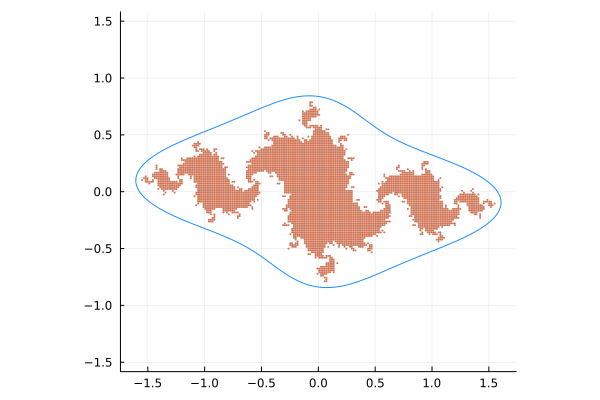

In [13]:
julia_plot(v, c)

Let's now look at degree 4.

In [14]:
v, w = outer_approximation(solver, 4, c)

* Solver : CSDP

* Status
  Result count       : 1
  Termination status : ALMOST_OPTIMAL
  Message from the solver:
  "Problem solved to near optimality."

* Candidate solution (result #1)
  Primal status      : NEARLY_FEASIBLE_POINT
  Dual status        : NEARLY_FEASIBLE_POINT
  Objective value    : 5.04150e+00
  Dual objective value : 5.04105e+00

* Work counters
  Solve time (sec)   : 6.54383e+00



(-0.006337037083583519x₁⁸ + 0.06544344152670001x₁⁷x₂ - 3.889144482343383x₁⁶x₂² + 0.14405270690693145x₁⁵x₂³ - 8.982532936339407x₁⁴x₂⁴ + 5.303958809756562x₁³x₂⁵ - 4.3681865172157766x₁²x₂⁶ - 4.670108656604897x₁x₂⁷ - 2.2386434304952347x₂⁸ + 0.014570133885293601x₁⁷ - 0.04925327604833046x₁⁶x₂ + 0.08272983423209898x₁⁵x₂² - 0.33977305362813737x₁⁴x₂³ + 0.226590292859749x₁³x₂⁴ + 0.24574009715891137x₁²x₂⁵ + 1.9157439852593867x₁x₂⁶ + 0.2575235115384302x₂⁷ - 0.06765830161842021x₁⁶ - 1.2139721077220298x₁⁵x₂ + 9.448244442751305x₁⁴x₂² - 5.31695734324634x₁³x₂³ + 3.2226045164818706x₁²x₂⁴ + 4.6907665658628765x₁x₂⁵ + 3.961448784291922x₂⁶ - 0.04644110267401108x₁⁵ + 0.215657456115312x₁⁴x₂ - 0.11742426975071574x₁³x₂² + 0.20980680654283246x₁²x₂³ - 1.1676302544719208x₁x₂⁴ - 0.18021064302593073x₂⁵ + 0.20399426165190765x₁⁴ + 2.0855120701608554x₁³x₂ - 6.517877625304281x₁²x₂² - 1.513273635457372x₁x₂³ - 3.888077635552248x₂⁴ + 0.031062481735875086x₁³ - 0.16428817619819353x₁²x₂ + 0.16139348712221524x₁x₂² - 0.00478903

We visualize below:

┌ Warning: Skipped marker arg pixel.
└ @ Plots ~/.julia/packages/Plots/io9zQ/src/args.jl:1147


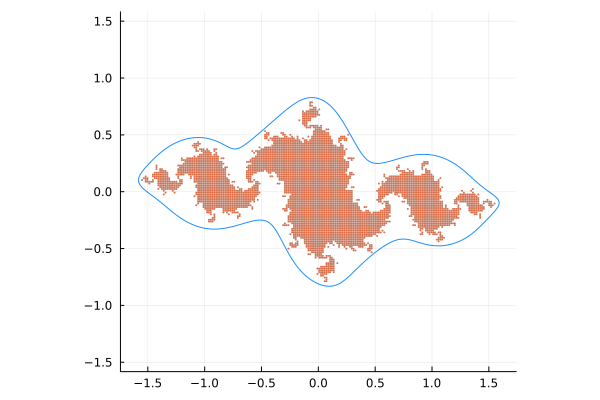

In [15]:
julia_plot(v, c)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*